A note book for documenting qualitative results

In [1]:
import os
import matplotlib.pyplot as plt
import torchvision
import torch
import pandas as pd
import numpy as np

from models import get_inception_transform
from data_loaders import CUB_extnded_dataset,CUB_CtoY_dataset
from IPython.display import display
from utils.notebook import display_scrollable_dataframe,plot_sailency
from sailency import get_saliency_maps,saliency_score_part

c:\Users\Andre\anaconda3\envs\CBM\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Settings for the experiment your running
data_set = 'test' 

#Make the dataset
transform = get_inception_transform(mode=data_set, methode= "center")

majority_config = {'CUB_dir':r'data/CUB_200_2011',
                'split_file':r'data/train_test_val.pkl',
                'use_majority_voting':True,
                'min_class_count':10,
                'return_visibility':False}

NoN_majority_config = {'CUB_dir':r'data/CUB_200_2011',
                'split_file':r'data/train_test_val.pkl',
                'use_majority_voting':False,
                'min_class_count':10,
                'return_visibility':False}

Non_majority_data_set = CUB_extnded_dataset(mode=data_set,config_dict=NoN_majority_config,transform=transform)


#Make the majority dataset and find the mask, we use CtoY dataset so we only need to loade the image ones 
Majority_dataset = CUB_CtoY_dataset(mode=data_set,config_dict=majority_config,transform=transform)
mask = Majority_dataset.concept_mask

#Make dataloader that return non standarized images
human_tansform = torchvision.transforms.Compose([torchvision.transforms.CenterCrop(299),torchvision.transforms.ToTensor()])
data_human = CUB_extnded_dataset(mode=data_set,config_dict=majority_config,transform=human_tansform)

#Define usefull variables
concept_names = data_human.consept_labels_names
class_names = data_human.class_labels_names
n_classes = data_human.n_classes
n_concepts = data_human.n_concepts

print(f"Number of classes: {n_classes}")
print(f"Number of concepts: {n_concepts}")

Number of classes: 200
Number of concepts: 112


In [3]:
#Find all idx for a class
class_id = 391

class_list = []
for i in range(len(Majority_dataset)):
    C,Y = Majority_dataset.__getitem__(i)
    Y = torch.argmax(Y)
    if Y == class_id:
        class_list.append(i)
print(class_list)





[]


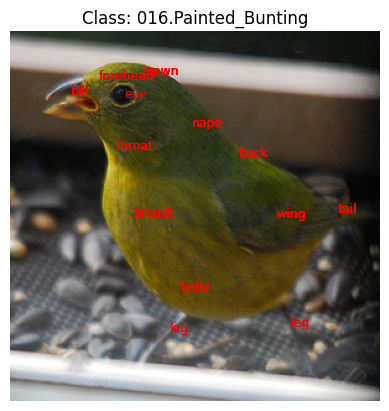

In [4]:
# Genrate the dataset
#picturer_idx = 400
picturer_idx = 391
#picturer_idx = 2454 #Gadwell

img ,_,Y,coordinates = data_human.__getitem__(picturer_idx)

# Show the image and the coordinates of the concepts
plt.imshow(img.permute(1, 2, 0))
plt.title(f"Class: {class_names[torch.argmax(Y)]}")
for i in range(len(coordinates)):
    if len(coordinates[i]) > 0:

        for x,y in coordinates[i]:
            #plt.plot(x,y,'ro')
            name=concept_names[i].split("_")[1]

            ofset = 0
            
            plt.text(x+ofset,y,name,fontsize=9,color='red')
    plt.axis('off')
            
plt.size=(50,50)
plt.show()

#Load the data
X, C, Y,coordinates = Non_majority_data_set.__getitem__(picturer_idx)
coordinates = [coordinates[i] for i in mask]
# Separate the concepts and their visibility only relevant if visibility is used and no majority voting is used
if len(C.shape) == 2:
    Concepts = C[0]
    Concepts_visiblity = C[1]
else:
    Concepts = C.tolist()
    Concepts_visiblity = [None]*len(C)

X = X.unsqueeze(0)


In [5]:
#Make concept dictionary
"""
concept_prediction = concept_prediction[0].detach()
concepts_propebability = torch.sigmoid(concept_prediction)
pridicted_class = Majority_dataset.concepts[Y]
#Apply mask
if concept_prediction.shape != Majority_C.shape:
    concept_prediction = concept_prediction[mask]
    concepts_propebability = concepts_propebability[mask]
"""


#Get ture labels 
_,NoN_Majority_C,_,_ = Non_majority_data_set.__getitem__(picturer_idx)
Majority_C,_ = Majority_dataset.__getitem__(picturer_idx)

#Find distribution of the concepts
Majority_concepts = Majority_dataset.concepts
NoN_Majority_concepts = np.array([Non_majority_data_set.concepts[y] for y in Non_majority_data_set.concepts.keys()])


Concept_dict={"Concept":concept_names,
                    "Label": NoN_Majority_C[mask].numpy().astype(bool),
                    #"Label distribution": np.mean(NoN_Majority_concepts,axis=0)[mask],
                    "Majority Label": Majority_C.numpy().astype(bool),
                    #"Majority ditribution": np.mean(Majority_concepts,axis=0)
                    "Wabler Majority": Majority_concepts[172].astype(bool)
                      }
    


  

In [6]:
#Test majority joint model
model_path = r'evaluate_models\Joint_CKPT_Majority\best_Joint_model.pth'

#Load the model
Joint_model = torch.load(model_path,map_location=torch.device('cpu'),weights_only=False)
Joint_model.eval()
Joint_model.use_sigmoid = True

#Make prediction
C_hat,Y_hat = Joint_model(X)
C_hat_probability = torch.sigmoid(C_hat)
Y_hat = torch.softmax(Y_hat,dim=1)
print(f"Predicted class: {class_names[Y_hat.argmax().item()]}, with {Y_hat[0,Y_hat.argmax()].item()} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
print(f"C_hat_probability of {class_names[172]} = {Y_hat[0,172]}")
#Make Concept prediction and other stuff
weights = Joint_model.CtoY_model.linear.weight[Y.argmax().item()]
Concept_dict["Joint MV"] = np.round(C_hat_probability.detach().numpy()[0],2)
#display_scrollable_dataframe(pd.DataFrame(Concept_dict))

Predicted class: 016.Painted_Bunting, with 0.01010738592594862 true class: 016.Painted_Bunting probability of true class: 0.01010738592594862
C_hat_probability of 173.Orange_crowned_Warbler = 0.009956402704119682


In [7]:
#Intervention on the bill


In [8]:
#Test NoN majority joint model
model_path = r'evaluate_models\Joint_CKPT_NoMajority\best_Joint_model.pth'

#Load the model
Joint_model = torch.load(model_path,map_location=torch.device('cpu'),weights_only=False)
Joint_model.eval()
Joint_model.use_sigmoid = True

#Make prediction
C_hat,Y_hat = Joint_model(X)
C_hat_probability = torch.sigmoid(C_hat)
Y_hat = torch.softmax(Y_hat,dim=1)
#print(f"Predicted class: {class_names[Y_hat.argmax().item()]} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
print(f"Predicted class: {class_names[Y_hat.argmax().item()]}, with {Y_hat[0,Y_hat.argmax()].item()} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
print(Y_hat.argmax().item())
#Make Concept prediction and other stuff
weights = Joint_model.CtoY_model.linear.weight[Y.argmax().item()]
Concept_dict["Joint NoN-MV"] = np.round(C_hat_probability.detach().numpy()[0][mask],2)
#display_scrollable_dataframe(pd.DataFrame(Concept_dict).sort_values(by=['Joint NonMajority prediction'],ascending=False))

Predicted class: 173.Orange_crowned_Warbler, with 0.010839049704372883 true class: 016.Painted_Bunting probability of true class: 0.010831981897354126
172


In [9]:
# Test the concept model with majority voting
XtoC_Model = torch.load(r'evaluate_models\Concepts_CKPT_Majority\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()

CtoY_Model = torch.load(r'evaluate_models\Sequential_Majority_end\best_CtoY_model.pth',map_location=torch.device('cpu'),weights_only=False)
CtoY_Model.eval()
CtoY_model = CtoY_Model.float()

#Make prediction
C_hat = XtoC_Model(X)
C_hat_probability = torch.sigmoid(C_hat)

Y_hat = torch.softmax(CtoY_Model(C_hat_probability),dim=1)

#print(f"Predicted class: {class_names[Y_hat.argmax().item()]} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
print(f"Predicted class: {class_names[Y_hat.argmax().item()]}, with {Y_hat[0,Y_hat.argmax()].item()} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
#Make Concept prediction and other stuff
weights = CtoY_Model.linear.weight[Y.argmax().item()]

Concept_dict["Sequential MV"] = np.round(C_hat_probability.detach().numpy()[0],2)
#display_scrollable_dataframe(pd.DataFrame(Concept_dict).sort_values(by=['Majority Label',"Label"],ascending=False))





Predicted class: 173.Orange_crowned_Warbler, with 0.9968275427818298 true class: 016.Painted_Bunting probability of true class: 4.544749465651421e-09


In [10]:
C_hat_probability[0,2]=0
C_hat_probability[0,3]=1
Y_hat = torch.softmax(CtoY_Model(C_hat_probability),dim=1)
print(f"Predicted class: {class_names[Y_hat.argmax().item()]}, with {Y_hat[0,Y_hat.argmax()].item()} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
#Concept_dict["Sequentia intervetnion"] = np.round(C_hat_probability.detach().numpy()[0],2)

Predicted class: 180.Wilson_Warbler, with 0.7971735596656799 true class: 016.Painted_Bunting probability of true class: 1.4012019846632029e-06


In [11]:
# Test the concept model with NoN majority voting
XtoC_Model = torch.load(r'evaluate_models\Concepts_CKPT_NoMajority\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()

CtoY_Model = torch.load(r'evaluate_models\Sequntial_NoMajority_end\best_CtoY_model.pth',map_location=torch.device('cpu'),weights_only=False)
CtoY_Model.eval()
CtoY_model = CtoY_Model.float()

#Make prediction
C_hat = XtoC_Model(X)
C_hat_probability = torch.sigmoid(C_hat)

Y_hat = torch.softmax(CtoY_Model(C_hat_probability),dim=1)

#print(f"Predicted class: {class_names[Y_hat.argmax().item()]} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
#print(f"Predicted class: {class_names[Y_hat.argmax().item()]} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
print(f"Predicted class: {class_names[Y_hat.argmax().item()]}, with {Y_hat[0,Y_hat.argmax()].item()} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
#Make Concept prediction and other stuff
weights = CtoY_Model.linear.weight[Y.argmax().item()]

Concept_dict["Sequential NoN-MV"] = np.round(C_hat_probability.detach().numpy()[0][mask],2)
#display_scrollable_dataframe(pd.DataFrame(Concept_dict).sort_values(by=['Majority Label',"Label"],ascending=False))

Predicted class: 173.Orange_crowned_Warbler, with 0.8646141290664673 true class: 016.Painted_Bunting probability of true class: 1.8601131159812212e-06


In [12]:
#Small intervention expriment setting bill shape to corne instead of all pourpose
C_hat_probability[0,6]=0
C_hat_probability[0,7]=1
Y_hat = torch.softmax(CtoY_Model(C_hat_probability),dim=1)
print(f"Predicted class: {class_names[Y_hat.argmax().item()]}, with {Y_hat[0,Y_hat.argmax()].item()} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")
#Concept_dict["Sequential NoN-MV intervetnion"] = np.round(C_hat_probability.detach().numpy()[0][mask],2)

Predicted class: 175.Pine_Warbler, with 0.9882937669754028 true class: 016.Painted_Bunting probability of true class: 7.201641096798994e-07


In [13]:
mask

array([  1,   4,   6,   7,  10,  14,  15,  20,  21,  23,  25,  29,  30,
        35,  36,  38,  40,  44,  45,  50,  51,  53,  54,  56,  57,  59,
        63,  64,  69,  70,  72,  75,  80,  84,  90,  91,  93,  99, 101,
       106, 110, 111, 116, 117, 119, 125, 126, 131, 132, 134, 145, 149,
       151, 152, 153, 157, 158, 163, 164, 168, 172, 178, 179, 181, 183,
       187, 188, 193, 194, 196, 198, 202, 203, 208, 209, 211, 212, 213,
       218, 220, 221, 225, 235, 236, 238, 239, 240, 242, 243, 244, 249,
       253, 254, 259, 260, 262, 268, 274, 277, 283, 289, 292, 293, 294,
       298, 299, 304, 305, 308, 309, 310, 311])

In [14]:
C_hat_probability.shape

torch.Size([1, 312])

In [15]:
#Add the baslines
Concept_dict["NoN-MV Label distribution"] = np.mean(NoN_Majority_concepts,axis=0)[mask]
Concept_dict["MV label ditribution"] = np.mean(Majority_concepts,axis=0)


In [16]:
Full_df=pd.DataFrame(Concept_dict)
Selected_df = Full_df[Full_df["Wabler Majority"] != Full_df["Majority Label"]]

# add row 39 to selected
#Selected_df = pd.concat([Selected_df,Full_df.iloc[[39,8,51]]])

display_scrollable_dataframe(Selected_df)

,Concept,Label,Majority Label,Wabler Majority,Joint MV,Joint NoN-MV,Sequential MV,Sequential NoN-MV,NoN-MV Label distribution,MV label ditribution
2,has_bill_shape::all-purpose,False,False,True,0.57,0.62,0.94,0.69,0.391754,0.405
3,has_bill_shape::cone,True,True,False,0.72,0.23,0.02,0.18,0.261452,0.245
41,has_breast_color::yellow,True,False,True,0.89,0.79,1.00,0.83,0.136834,0.145
53,has_forehead_color::blue,False,True,False,0.40,0.00,0.01,0.00,0.050814,0.050
72,has_belly_color::yellow,True,False,True,0.90,0.62,1.00,0.77,0.143536,0.145
83,has_back_pattern::solid,False,False,True,0.01,0.45,0.63,0.31,0.365032,0.495
85,has_back_pattern::multi-colored,True,True,False,1.00,0.32,0.40,0.25,0.194774,0.070
88,has_tail_pattern::multi-colored,False,False,True,0.02,0.20,0.59,0.26,0.227859,0.130
96,has_leg_color::grey,True,True,False,0.78,0.29,0.05,0.31,0.255599,0.225
102,has_crown_color::blue,False,True,False,0.40,0.01,0.01,0.00,0.054971,0.050


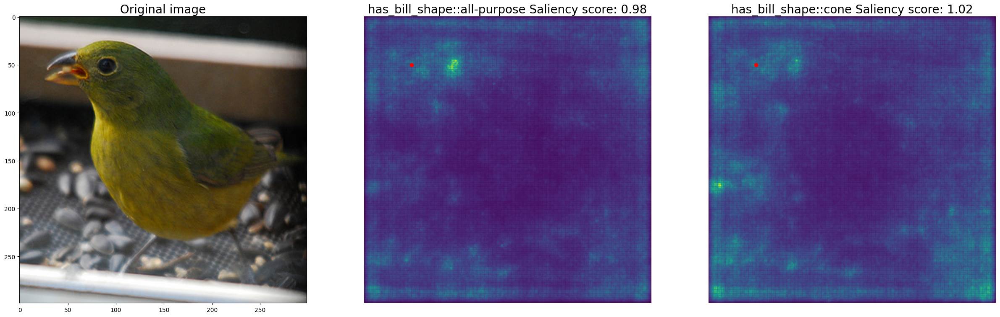

In [17]:
concept_list = [2,3]#,102,41]
Joint_model = torch.load(r'evaluate_models\Joint_CKPT_Majority\best_Joint_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model = Joint_model.XtoC_model
XtoC_Model.eval()
sailency_maps = get_saliency_maps(X,concept_list,XtoC_Model,method_type='noise_tunnel')

plot_sailency(img,sailency_maps,concept_list,concept_names,coordinates)

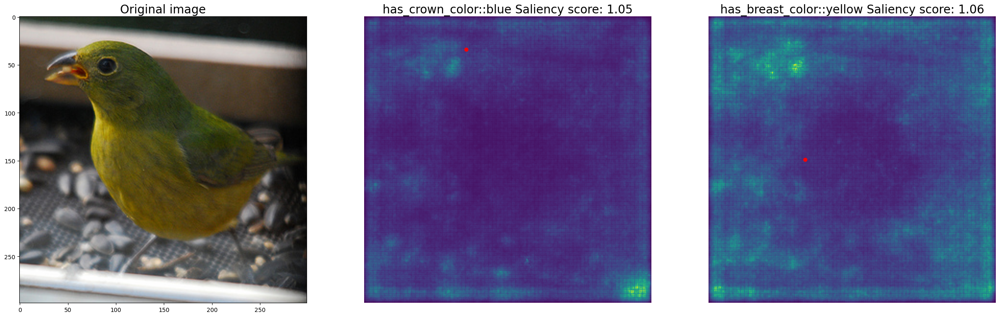

In [18]:
concept_list = [102,41]#,102,41]
Joint_model = torch.load(r'evaluate_models\Joint_CKPT_Majority\best_Joint_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model = Joint_model.XtoC_model
XtoC_Model.eval()
sailency_maps = get_saliency_maps(X,concept_list,XtoC_Model,method_type='noise_tunnel')

plot_sailency(img,sailency_maps,concept_list,concept_names,coordinates)

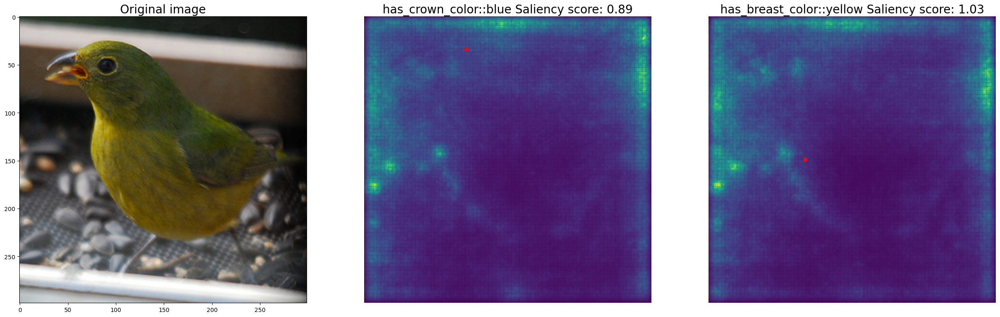

In [19]:

XtoC_Model = torch.load(r'evaluate_models\Concepts_CKPT_Majority\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()
sailency_maps = get_saliency_maps(X,concept_list,XtoC_Model,method_type='noise_tunnel')

plot_sailency(img,sailency_maps,concept_list,concept_names,coordinates)

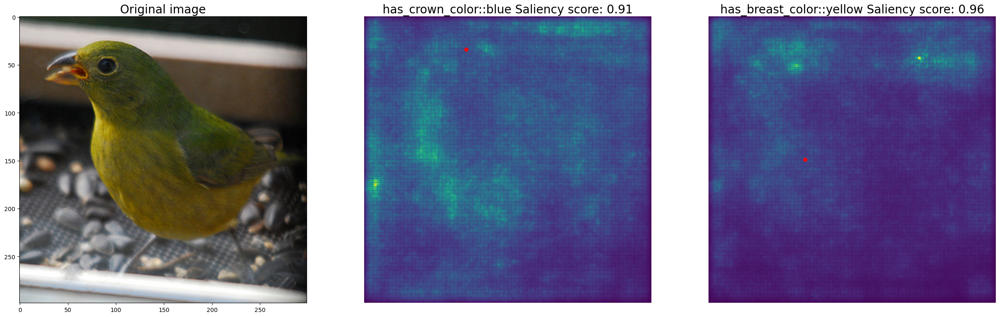

In [20]:
#concept_list = [39,8,51]
XtoC_Model = torch.load(r'evaluate_models\Concepts_CKPT_NoMajority\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()
sailency_maps = get_saliency_maps(X,concept_list,XtoC_Model,method_type='noise_tunnel')

plot_sailency(img,sailency_maps,concept_list,concept_names,coordinates)

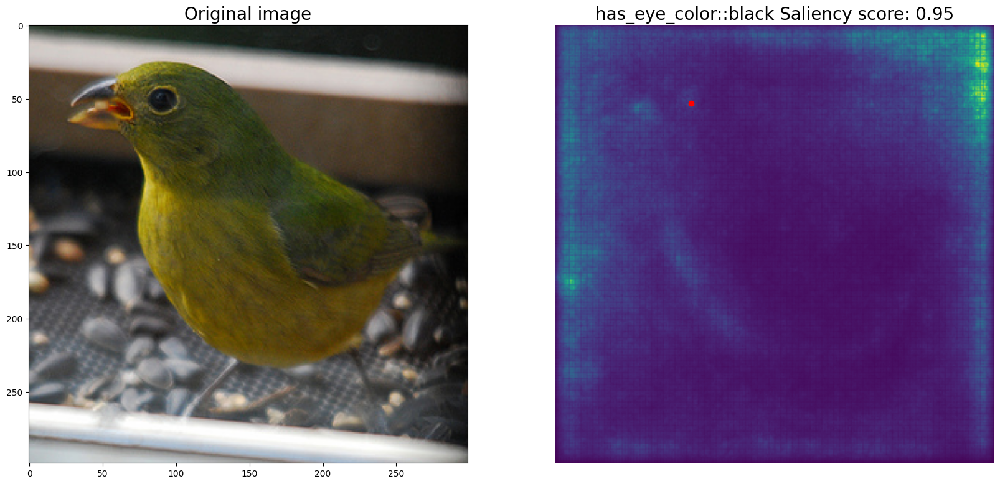

In [21]:
concept_list = [50]
XtoC_Model = torch.load(r'evaluate_models\Concepts_CKPT_Majority\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()
sailency_maps = get_saliency_maps(X,concept_list,XtoC_Model,method_type='noise_tunnel')

plot_sailency(img,sailency_maps,concept_list,concept_names,coordinates)

In [22]:
#print full df
display_scrollable_dataframe(Full_df.sort_values(by=['Majority Label',"Label"],ascending=False))

,Concept,Label,Majority Label,Wabler Majority,Joint MV,Joint NoN-MV,Sequential MV,Sequential NoN-MV,NoN-MV Label distribution,MV label ditribution
3,has_bill_shape::cone,True,True,False,0.72,0.23,0.02,0.18,0.261452,0.245
50,has_eye_color::black,True,True,True,1.00,0.89,1.00,0.93,0.837462,0.960
52,has_bill_length::shorter_than_head,True,True,True,1.00,0.85,1.00,0.81,0.561079,0.630
85,has_back_pattern::multi-colored,True,True,False,1.00,0.32,0.40,0.25,0.194774,0.070
96,has_leg_color::grey,True,True,False,0.78,0.29,0.05,0.31,0.255599,0.225
99,has_bill_color::grey,True,True,True,0.68,0.53,0.82,0.64,0.273583,0.125
111,has_wing_pattern::multi-colored,True,True,False,1.00,0.27,0.36,0.33,0.297336,0.220
22,has_breast_pattern::solid,False,True,True,1.00,0.61,0.94,0.63,0.548269,0.645
31,has_tail_shape::notched_tail,False,True,True,0.80,0.34,0.55,0.35,0.297506,0.290
53,has_forehead_color::blue,False,True,False,0.40,0.00,0.01,0.00,0.050814,0.050


In [23]:
print(Selected_df.to_latex(index=False, float_format="%.3f"))

\begin{tabular}{lrrrrrrrrr}
\toprule
Concept & Label & Majority Label & Wabler Majority & Joint MV & Joint NoN-MV & Sequential MV & Sequential NoN-MV & NoN-MV Label distribution & MV label ditribution \\
\midrule
has_bill_shape::all-purpose & False & False & True & 0.570 & 0.620 & 0.940 & 0.690 & 0.392 & 0.405 \\
has_bill_shape::cone & True & True & False & 0.720 & 0.230 & 0.020 & 0.180 & 0.261 & 0.245 \\
has_breast_color::yellow & True & False & True & 0.890 & 0.790 & 1.000 & 0.830 & 0.137 & 0.145 \\
has_forehead_color::blue & False & True & False & 0.400 & 0.000 & 0.010 & 0.000 & 0.051 & 0.050 \\
has_belly_color::yellow & True & False & True & 0.900 & 0.620 & 1.000 & 0.770 & 0.144 & 0.145 \\
has_back_pattern::solid & False & False & True & 0.010 & 0.450 & 0.630 & 0.310 & 0.365 & 0.495 \\
has_back_pattern::multi-colored & True & True & False & 1.000 & 0.320 & 0.400 & 0.250 & 0.195 & 0.070 \\
has_tail_pattern::multi-colored & False & False & True & 0.020 & 0.200 & 0.590 & 0.260 & 0.228

In [24]:
display_scrollable_dataframe(Full_df)

,Concept,Label,Majority Label,Wabler Majority,Joint MV,Joint NoN-MV,Sequential MV,Sequential NoN-MV,NoN-MV Label distribution,MV label ditribution
0,has_bill_shape::dagger,False,False,False,0.00,0.01,0.00,0.02,0.134968,0.085
1,has_bill_shape::hooked_seabird,False,False,False,0.00,0.00,0.00,0.00,0.063709,0.060
2,has_bill_shape::all-purpose,False,False,True,0.57,0.62,0.94,0.69,0.391754,0.405
3,has_bill_shape::cone,True,True,False,0.72,0.23,0.02,0.18,0.261452,0.245
4,has_wing_color::brown,False,False,False,0.00,0.01,0.00,0.08,0.269681,0.245
5,has_wing_color::grey,False,False,False,0.15,0.25,0.08,0.26,0.300390,0.230
6,has_wing_color::yellow,True,False,False,0.40,0.15,0.23,0.33,0.091703,0.060
7,has_wing_color::black,False,False,False,0.04,0.12,0.05,0.31,0.428487,0.410
8,has_wing_color::white,False,False,False,0.01,0.05,0.01,0.15,0.260774,0.205
9,has_wing_color::buff,False,False,False,0.00,0.01,0.00,0.04,0.182474,0.130


In [25]:
df=pd.DataFrame(Concept_dict).sort_values(by=['Majority Label',"Label"],ascending=False)
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrrrrr}
\toprule
Concept & Label & Majority Label & Wabler Majority & Joint MV & Joint NoN-MV & Sequential MV & Sequential NoN-MV & NoN-MV Label distribution & MV label ditribution \\
\midrule
has_bill_shape::cone & True & True & False & 0.720000 & 0.230000 & 0.020000 & 0.180000 & 0.261452 & 0.245000 \\
has_eye_color::black & True & True & True & 1.000000 & 0.890000 & 1.000000 & 0.930000 & 0.837462 & 0.960000 \\
has_bill_length::shorter_than_head & True & True & True & 1.000000 & 0.850000 & 1.000000 & 0.810000 & 0.561079 & 0.630000 \\
has_back_pattern::multi-colored & True & True & False & 1.000000 & 0.320000 & 0.400000 & 0.250000 & 0.194774 & 0.070000 \\
has_leg_color::grey & True & True & False & 0.780000 & 0.290000 & 0.050000 & 0.310000 & 0.255599 & 0.225000 \\
has_bill_color::grey & True & True & True & 0.680000 & 0.530000 & 0.820000 & 0.640000 & 0.273583 & 0.125000 \\
has_wing_pattern::multi-colored & True & True & False & 1.000000 & 0.270000 & 0.360000 & 0.330